# Nuclei Classification - A Toy Example
by [Qin Yu](https://github.com/qin-yu), Dec 2020

In [1]:
import h5py
import glob
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

In [2]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from skimage.color import rgb2gray

## Save all datasets/images in `uint32` format
This is not required for this notebook, but essential for feeding the data into ilastik to play with:

In [3]:
# for file_path in glob.glob("./CovidGroundTruth/*"):
#     if file_path[-6:] == "new.h5": continue
#     file_path_new = file_path[:-3] + "_new.h5"
#     with h5py.File(file_path, 'r') as f:
#         with h5py.File(file_path_new, 'w') as f_new:
#             f_new.create_dataset('raw', data=f['raw'][:].astype(np.uint32))
#             f_new.create_dataset('cells', data=f['cells'][:].astype(np.uint32))
#             f_new.create_dataset('infected', data=f['infected'][:].astype(np.uint32))

## Extract Features from All Nuclei for One Image

In [4]:
file_path = "./CovidGroundTruth/WellA04_PointA04_0007_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0025.h5"

In [5]:
with h5py.File(file_path, 'r') as f:
    print(f"The `.h5` file contains {list(f.keys())} datasets:")
    print(f['raw'], f['raw'].dtype)
    print(f['cells'], f['cells'].dtype)
    print(f['infected'], f['infected'].dtype)
        
    seq_raw = f['raw'][:].transpose((1,2,0))
    seq_mask = f['cells'][:]
    seq_label = f['infected'][:]

The `.h5` file contains ['cells', 'infected', 'raw'] datasets:
<HDF5 dataset "raw": shape (3, 1024, 1024), type "|u1"> uint8
<HDF5 dataset "cells": shape (1024, 1024), type "<u2"> uint16
<HDF5 dataset "infected": shape (1024, 1024), type "<u2"> uint16


### Re-identify all cell with consecutive integer

In [6]:
for idx, original_label in enumerate(np.unique(seq_mask)):
    seq_mask[seq_mask == original_label] = idx

### Have a look at the data
- Note that there are hundreds of cells in the mask dataset, but the plot doesn't show it perfectly
- The nuclei in the label dataset is not segmented perfectly, which determines the method I use to match labels to masks

In [7]:
print(f"There are {len(np.unique(seq_mask)) - 1} different cell masks")
print(f"There are {len(np.unique(measure.label(seq_label))) - 1} separate nucleus labels")

There are 352 different cell masks
There are 325 separate nucleus labels


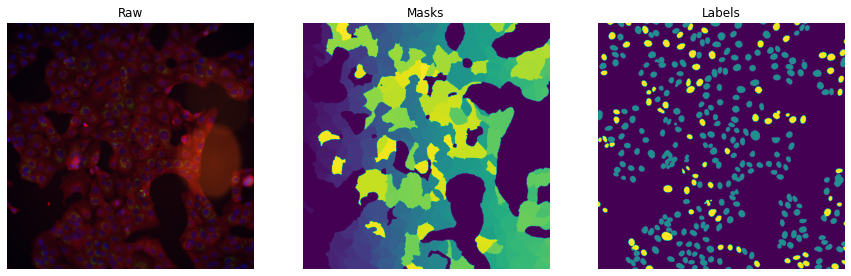

In [8]:
plt.figure(figsize=(15, 5))
plt.subplot(131); plt.imshow(seq_raw); plt.axis("off"); plt.title("Raw");
plt.subplot(132); plt.imshow(seq_mask); plt.axis("off"); plt.title("Masks");
plt.subplot(133); plt.imshow(seq_label); plt.axis("off"); plt.title("Labels");

To show the masks clearly:

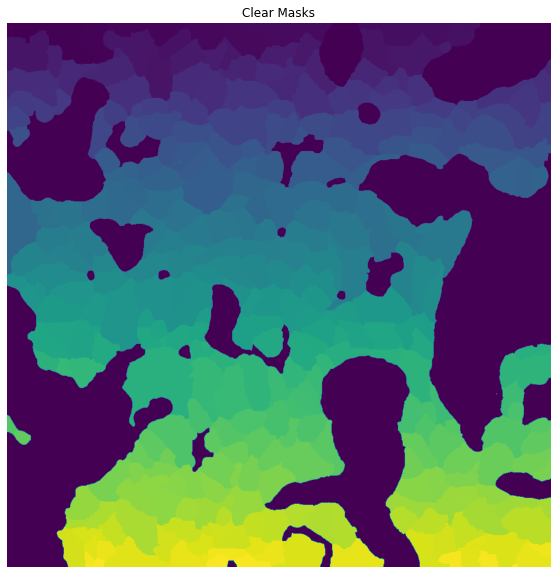

In [9]:
plt.figure(figsize=(10,10))
plt.imshow(measure.label(seq_mask)); plt.axis("off"); plt.title("Clear Masks");

### Extract region properties

In [10]:
fig = px.imshow(seq_raw, binary_string=True, width=800, height=800)
fig.update_traces(hoverinfo='skip')  # hover is only for label info

props = measure.regionprops(seq_mask, rgb2gray(seq_raw))
# properties = ['area', 'eccentricity', 'perimeter', 'mean_intensity']
properties = ['area',
              'bbox_area',
              'convex_area',
              'eccentricity',
              'equivalent_diameter',
              'euler_number',
              'extent',
              'filled_area',
              'major_axis_length',
              'max_intensity',
              'mean_intensity',
              'min_intensity',
              'minor_axis_length',
              'orientation',
              'perimeter',
              'solidity']
len(props)

352

### Illustrate selected properties

In [11]:
for index in range(seq_mask.max()):
    label = props[index].label
    contour = measure.find_contours(seq_mask == label, 0.5)[0]
    y, x = contour.T
    hoverinfo = ''
    for prop_name in properties:
        hoverinfo += f'<b>{prop_name}: {getattr(props[index], prop_name):.2f}</b><br>'
    fig.add_trace(go.Scatter(
        x=x, y=y, name=label,
        mode='lines', fill='toself', showlegend=False,
        hovertemplate=hoverinfo, hoveron='points+fills'))

In [12]:
file_path

'./CovidGroundTruth/WellA04_PointA04_0007_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0025.h5'


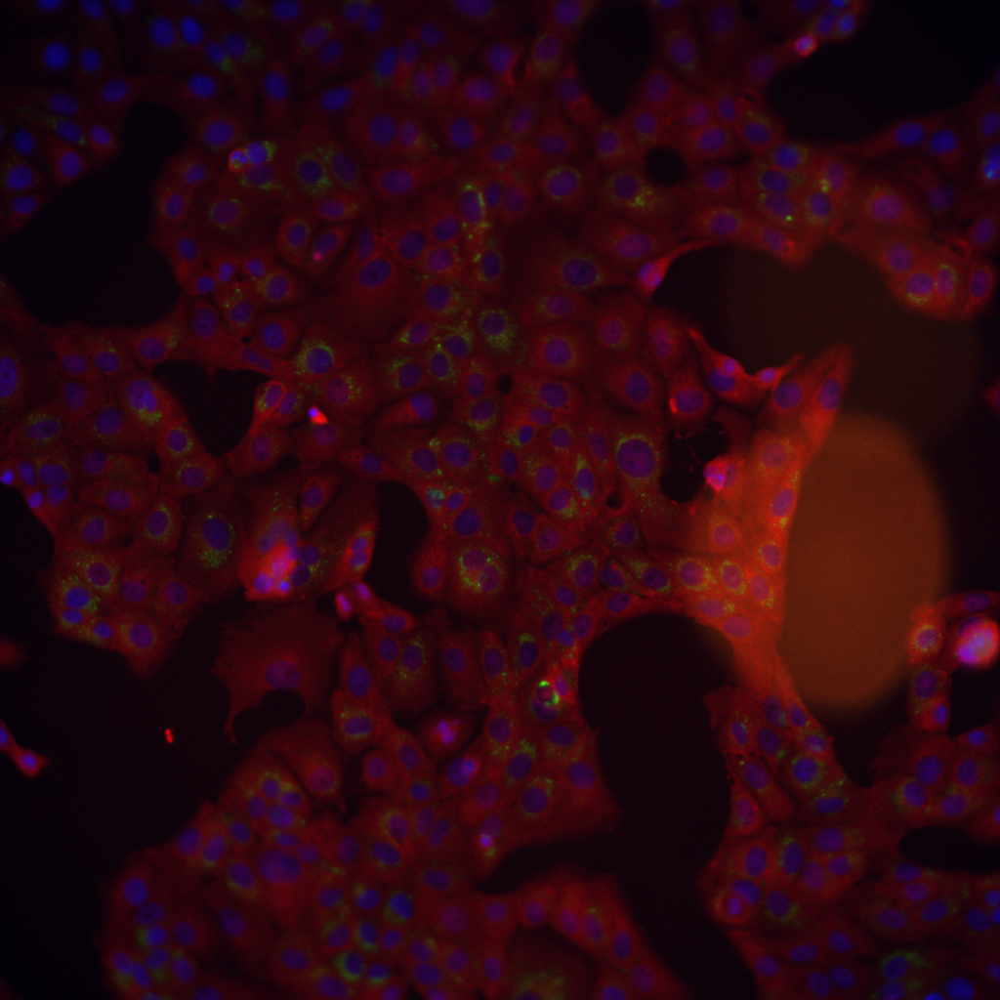

In [13]:
fig  # ID on the figure is always 1 + real ID

### Illustrate label-matching

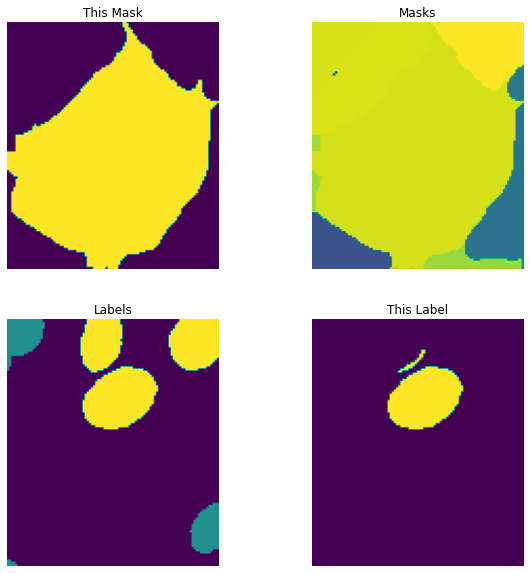

In [14]:
mask_id = 316

plt.figure(figsize=(10,10))
plt.subplot(221); plt.imshow(props[mask_id].image); plt.axis("off"); plt.title("This Mask")

bbox = props[mask_id].bbox
plt.subplot(222); plt.imshow(seq_mask[bbox[0]:bbox[2], bbox[1]:bbox[3]]); plt.axis("off"); plt.title("Masks")
plt.subplot(223); plt.imshow(seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]]); plt.axis("off"); plt.title("Labels")

nucleus = seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]] * props[mask_id].image
plt.subplot(224); plt.imshow(nucleus); plt.axis("off"); plt.title("This Label");

### Match all labels

In [15]:
true_labels = np.zeros(len(props))
print("The following cell mask IDs have no corresponding nuclei labels:")
for idx, prop in enumerate(props):
    bbox = prop.bbox
    nucleus = seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]] * prop.image
    labels, counts = np.unique(nucleus, return_counts=True)
    if len(labels) == 1:
        print(idx, end=', ')
        continue
    if labels[np.argmax(counts)] == 0:
        count2nd = counts.argsort()[-2]  # get the second largest label index
        true_labels[idx] = labels[count2nd]
    else:  # the biggest count is not for bg
        true_labels[idx] = labels[np.argmax(counts)]

The following cell mask IDs have no corresponding nuclei labels:
3, 338, 

In [16]:
true_labels, len(true_labels)

(array([1., 1., 1., 0., 2., 2., 1., 2., 1., 1., 2., 2., 2., 1., 2., 2., 2.,
        1., 1., 1., 1., 2., 2., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 2., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2.,
        2., 1., 1., 1., 2., 1., 2., 2., 2., 1., 1., 1., 2., 1., 1., 1., 1.,
        1., 1., 2., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 2., 1., 1.,
        1., 1., 1., 1., 1., 2., 2., 1., 2., 1., 1., 1., 2., 2., 1., 1., 1.,
        2., 1., 1., 2., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2.,
        1., 2., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 2., 1., 1., 1., 1., 2., 1., 1., 2., 2., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2.,
        2., 

In [17]:
np.unique(true_labels, return_counts=True)

(array([0., 1., 2.]), array([  3, 261,  88]))

In [18]:
np.where(true_labels == 0)

(array([  3, 257, 338]),)

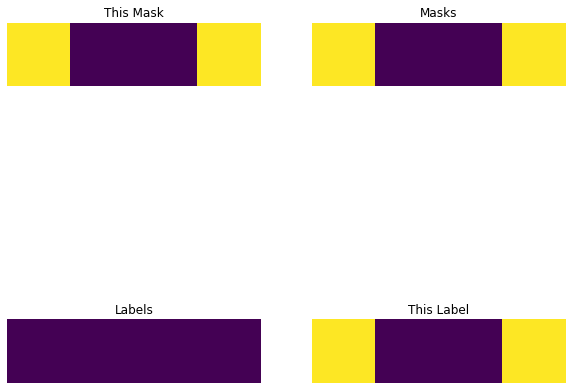

In [19]:
mask_id = 257

plt.figure(figsize=(10,10))
plt.subplot(221); plt.imshow(props[mask_id].image); plt.axis("off"); plt.title("This Mask")

bbox = props[mask_id].bbox
plt.subplot(222); plt.imshow(seq_mask[bbox[0]:bbox[2], bbox[1]:bbox[3]]); plt.axis("off"); plt.title("Masks")
plt.subplot(223); plt.imshow(seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]]); plt.axis("off"); plt.title("Labels")

nucleus = seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]] * props[mask_id].image
plt.subplot(224); plt.imshow(nucleus); plt.axis("off"); plt.title("This Label");

In [20]:
labels, counts = np.unique(nucleus, return_counts=True)
count2nd = counts.argsort()[-2]
labels, counts, counts.argsort(), count2nd, labels[count2nd]

(array([0, 2], dtype=uint16), array([2, 2]), array([0, 1]), 0, 0)

### Two masks have no labels

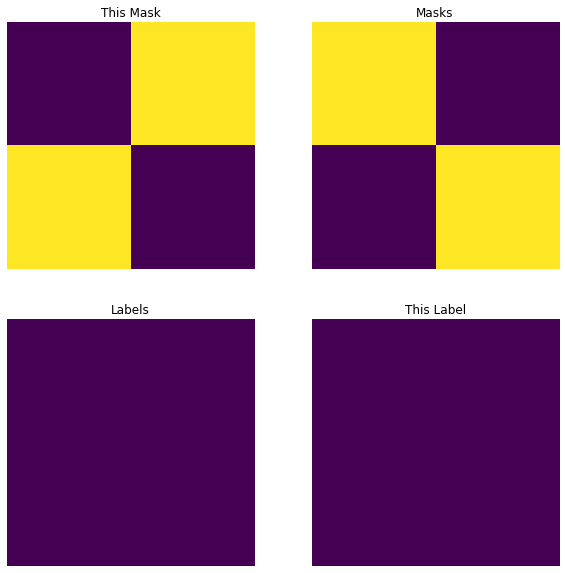

In [21]:
mask_id = 3

plt.figure(figsize=(10,10))
plt.subplot(221); plt.imshow(props[mask_id].image); plt.axis("off"); plt.title("This Mask")

bbox = props[mask_id].bbox
plt.subplot(222); plt.imshow(seq_mask[bbox[0]:bbox[2], bbox[1]:bbox[3]]); plt.axis("off"); plt.title("Masks")
plt.subplot(223); plt.imshow(seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]]); plt.axis("off"); plt.title("Labels")

nucleus = seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]] * props[mask_id].image
plt.subplot(224); plt.imshow(nucleus); plt.axis("off"); plt.title("This Label");

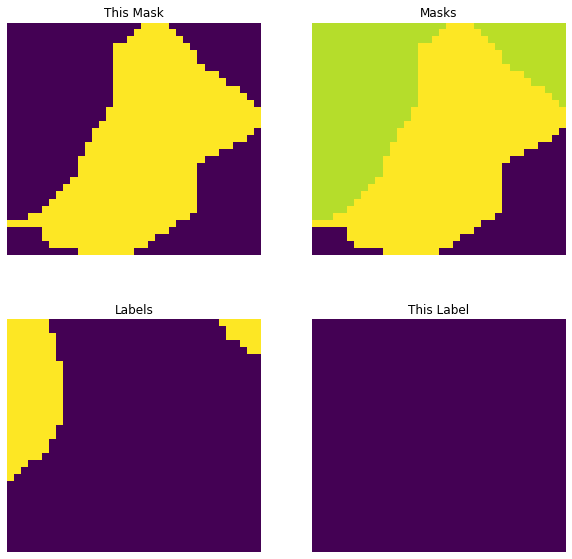

In [22]:
mask_id = 338

plt.figure(figsize=(10,10))
plt.subplot(221); plt.imshow(props[mask_id].image); plt.axis("off"); plt.title("This Mask")

bbox = props[mask_id].bbox
plt.subplot(222); plt.imshow(seq_mask[bbox[0]:bbox[2], bbox[1]:bbox[3]]); plt.axis("off"); plt.title("Masks")
plt.subplot(223); plt.imshow(seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]]); plt.axis("off"); plt.title("Labels")

nucleus = seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]] * props[mask_id].image
plt.subplot(224); plt.imshow(nucleus); plt.axis("off"); plt.title("This Label");

In [23]:
# plt.subplot(121); plt.imshow(props[3].image)
# plt.subplot(122); plt.imshow(props[338].image)

In [24]:
# plt.subplot(121)
# bbox = props[3].bbox
# plt.imshow(seq_infe[bbox[0]:bbox[2], bbox[1]:bbox[3]])
# plt.subplot(122)
# bbox = props[338].bbox
# plt.imshow(seq_infe[bbox[0]:bbox[2], bbox[1]:bbox[3]])

### Features extracted

In [25]:
mask_id = 316  # doesn't matter, any ID

In [26]:
property_table = []
scalar_table = []
for prop in props[mask_id]:
    entry = [prop, 
             type(props[mask_id][prop]),
             np.array(props[mask_id][prop]).shape]
    property_table.append(entry)
    if np.array(props[mask_id][prop]).shape == ():
        scalar_table.append(entry[:-1])
    
property_table = np.array(property_table, dtype=object)
scalar_table = np.array(scalar_table, dtype=object)

All properties of a given region (all features available):

In [27]:
pd.DataFrame(property_table[:, 1:3],
             columns=['type', 'shape'],
             index=property_table[:, 0])

,type,shape
area,<class 'numpy.int64'>,()
bbox,<class 'tuple'>,"(4,)"
bbox_area,<class 'int'>,()
centroid,<class 'tuple'>,"(2,)"
convex_area,<class 'numpy.int64'>,()
convex_image,<class 'numpy.ndarray'>,"(118, 101)"
coords,<class 'numpy.ndarray'>,"(6844, 2)"
eccentricity,<class 'float'>,()
equivalent_diameter,<class 'float'>,()
euler_number,<class 'int'>,()


All scalar properties:

In [28]:
pd.DataFrame(scalar_table[:, 1], 
             columns=['type'], 
             index=scalar_table[:, 0])

,type
area,<class 'numpy.int64'>
bbox_area,<class 'int'>
convex_area,<class 'numpy.int64'>
eccentricity,<class 'float'>
equivalent_diameter,<class 'float'>
euler_number,<class 'int'>
extent,<class 'numpy.float64'>
filled_area,<class 'numpy.int64'>
label,<class 'int'>
major_axis_length,<class 'float'>


## Prepare Training Data

In [29]:
desired_features = scalar_table[:, 0].tolist()
desired_features.remove('label')
desired_features

['area',
 'bbox_area',
 'convex_area',
 'eccentricity',
 'equivalent_diameter',
 'euler_number',
 'extent',
 'filled_area',
 'major_axis_length',
 'max_intensity',
 'mean_intensity',
 'min_intensity',
 'minor_axis_length',
 'orientation',
 'perimeter',
 'solidity']

In [30]:
features = np.zeros((len(props), len(desired_features)))
features[316] = [float(getattr(props[316], prop_name)) for prop_name in desired_features]

In [31]:
features[316]

array([ 6.84400000e+03,  1.19180000e+04,  7.83600000e+03,  6.26312755e-01,
        9.33490838e+01,  1.00000000e+00,  5.74257426e-01,  6.84400000e+03,
        1.07417646e+02,  1.14714510e-01,  5.47609489e-02,  3.17717647e-02,
        8.37397772e+01, -6.95552332e-01,  3.73025433e+02,  8.73404798e-01])

In [32]:
def extract_training_data(file_path):
    with h5py.File(file_path, 'r') as f:
        seq_raw = f['raw'][:].transpose((1,2,0))
        seq_mask = f['cells'][:]
        seq_label = f['infected'][:]
    
    for idx, original_label in enumerate(np.unique(seq_mask)):
        seq_mask[seq_mask == original_label] = idx
    print(f"There are {len(np.unique(seq_mask)) - 1} different cell masks, excluding bg")
    print(f"There are {len(np.unique(measure.label(seq_label))) - 1} separate nucleus labels, excluding bg")
    
    props = measure.regionprops(seq_mask, rgb2gray(seq_raw))
    
    features = np.zeros((len(props), len(desired_features)))
    true_labels = np.zeros(len(props))
    no_labels = []
    print("The following cell mask IDs have no corresponding nuclei labels:")
    for idx, prop in enumerate(props):
        bbox = prop.bbox
        nucleus = seq_label[bbox[0]:bbox[2], bbox[1]:bbox[3]] * prop.image
        labels, counts = np.unique(nucleus, return_counts=True)
        if len(labels) == 1:
            print(idx, end=', ')
            no_labels.append(idx)
            continue
        if labels[np.argmax(counts)] == 0:
            count2nd = counts.argsort()[-2]  # get the second largest label index
            true_labels[idx] = labels[count2nd]
        else:  # the biggest count is not for bg
            true_labels[idx] = labels[np.argmax(counts)]
            
        # assert true_labels[idx] != 0
        if true_labels[idx] == 0:
            print(f"!! EXCEPTION !!: BAD MASK {idx}")
        
        features[idx] = [float(getattr(prop, prop_name)) for prop_name in desired_features]
        
    print()
    return features, true_labels

In [33]:
features, true_labels = extract_training_data(file_path)

There are 352 different cell masks, excluding bg
There are 325 separate nucleus labels, excluding bg
The following cell mask IDs have no corresponding nuclei labels:
3, !! EXCEPTION !!: BAD MASK 257
338, 


In [34]:
features.shape

(352, 16)

In [35]:
np.unique(true_labels, return_counts=True)

(array([0., 1., 2.]), array([  3, 261,  88]))

./CovidGroundTruth/WellG02_PointG02_0001_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0658.h5
There are 440 different cell masks
There are 388 separate nucleus labels
./CovidGroundTruth/WellD11_PointD11_0000_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0270.h5
There are 505 different cell masks
There are 489 separate nucleus labels
./CovidGroundTruth/WellG05_PointG05_0001_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0685.h5
There are 386 different cell masks
There are 331 separate nucleus labels
./CovidGroundTruth/WellE02_PointE02_0000_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0405.h5
There are 453 different cell masks
There are 409 separate nucleus labels
./CovidGroundTruth/WellA04_PointA04_0007_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0025.h5
There are 352 different cell masks
There are 325 separate nucleus labels
./CovidGroundTruth/WellE05_PointE05_0004_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0454.h5
There are 383 different cell masks
There are 351 separate nucleus labels


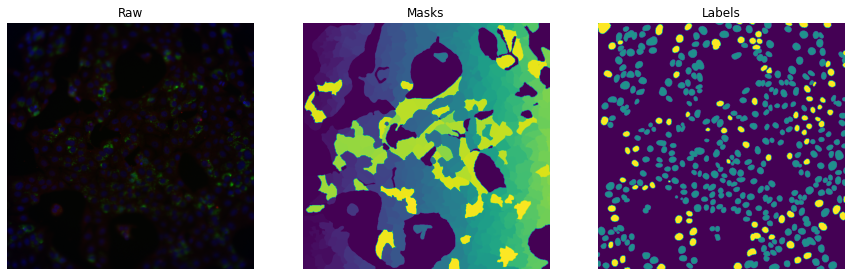

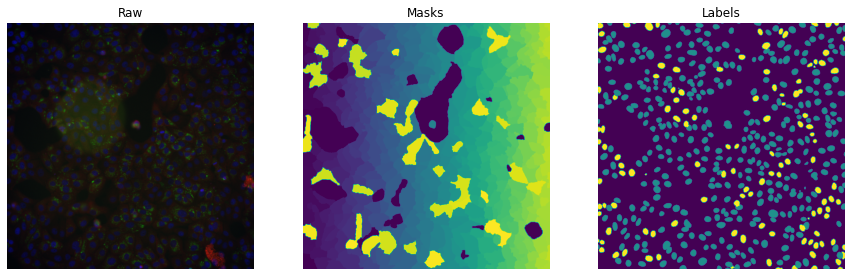

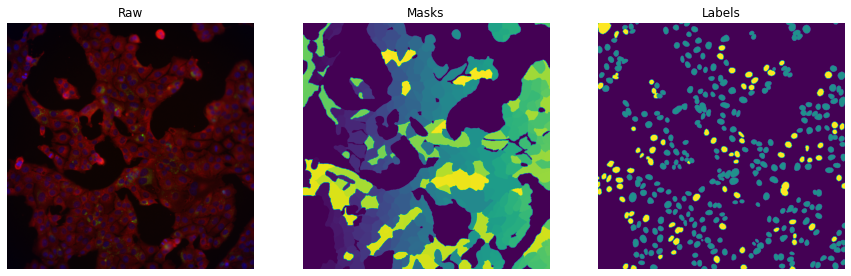

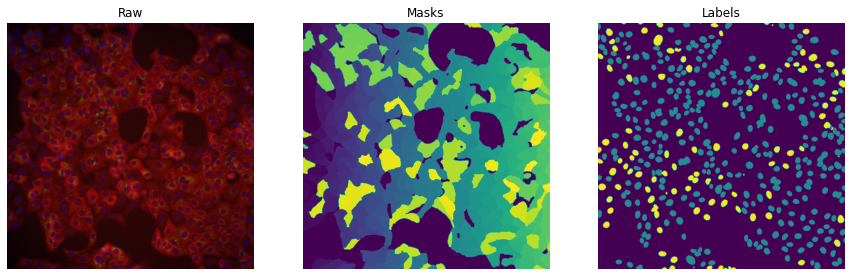

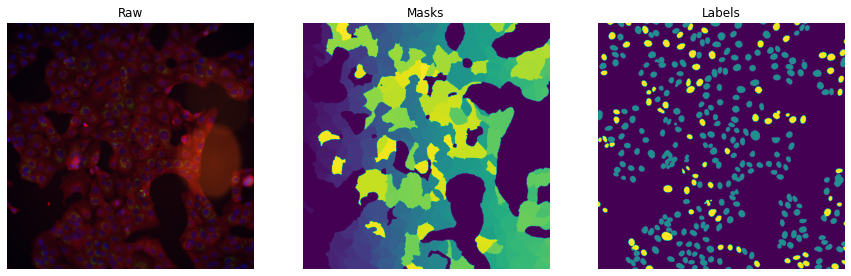

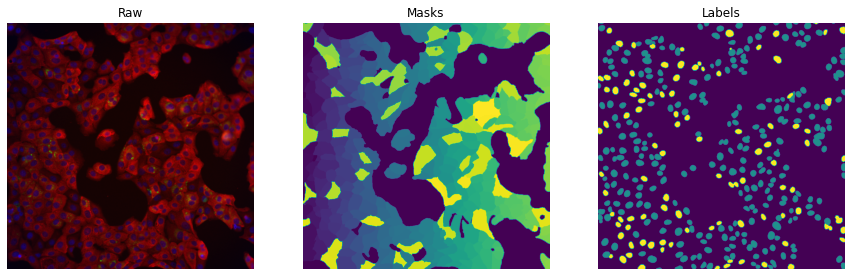

In [36]:
file_list = []
for file_path in glob.glob("./CovidGroundTruth/*"):
    if file_path[-6:] == "new.h5": continue
    file_list.append(file_path)
    print(file_path)
    with h5py.File(file_path, 'r') as f:
        seq_raw = f['raw'][:].transpose((1,2,0))
        seq_mask = f['cells'][:]
        seq_label = f['infected'][:]
    
    for idx, original_label in enumerate(np.unique(seq_mask)):
        seq_mask[seq_mask == original_label] = idx
    
    print(f"There are {len(np.unique(seq_mask)) - 1} different cell masks")
    print(f"There are {len(np.unique(measure.label(seq_label))) - 1} separate nucleus labels")
    
    plt.figure(figsize=(15, 5))
    plt.subplot(131); plt.imshow(seq_raw); plt.axis("off"); plt.title("Raw");
    plt.subplot(132); plt.imshow(seq_mask); plt.axis("off"); plt.title("Masks");
    plt.subplot(133); plt.imshow(seq_label); plt.axis("off"); plt.title("Labels");

In [37]:
X = np.zeros((0, 16))
y = np.zeros(0)
X, y

(array([], shape=(0, 16), dtype=float64), array([], dtype=float64))

In [38]:
feature_list = []
label_list = []

In [39]:
for file_path in file_list:
    if file_path[-6:] == "new.h5": continue
        
    print(file_path)
    with h5py.File(file_path, 'r') as f:
        seq_raw = f['raw'][:].transpose((1,2,0))
        seq_mask = f['cells'][:]
        seq_label = f['infected'][:]
    
    for idx, original_label in enumerate(np.unique(seq_mask)):
        seq_mask[seq_mask == original_label] = idx
        
    features, true_labels = extract_training_data(file_path)
    feature_list.append(features)
    label_list.append(true_labels)

./CovidGroundTruth/WellG02_PointG02_0001_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0658.h5
There are 440 different cell masks, excluding bg
There are 388 separate nucleus labels, excluding bg
The following cell mask IDs have no corresponding nuclei labels:
348, 412, 
./CovidGroundTruth/WellD11_PointD11_0000_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0270.h5
There are 505 different cell masks, excluding bg
There are 489 separate nucleus labels, excluding bg
The following cell mask IDs have no corresponding nuclei labels:
83, 
./CovidGroundTruth/WellG05_PointG05_0001_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0685.h5
There are 386 different cell masks, excluding bg
There are 331 separate nucleus labels, excluding bg
The following cell mask IDs have no corresponding nuclei labels:
0, 1, 341, 354, 359, 
./CovidGroundTruth/WellE02_PointE02_0000_ChannelDAPI,WF_GFP,TRITC,WF_Cy5,DIA_Seq0405.h5
There are 453 different cell masks, excluding bg
There are 409 separate nucleus labels, excluding bg
The followi

## Train on 2, 3, 4 and Test on 5

In [40]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

In [41]:
X = np.concatenate(feature_list[2:4])
y = np.concatenate(label_list[2:4])
print(f"X.shape, y.shape = {X.shape, y.shape}")
print(f"labels, counts = {np.unique(y, return_counts=True)}")

X = np.delete(X, np.where(y == 0), axis=0)
y = np.delete(y, np.where(y == 0))
print(f"X.shape, y.shape = {X.shape, y.shape}")
print(f"labels, counts = {np.unique(y, return_counts=True)}")

X.shape, y.shape = ((839, 16), (839,))
labels, counts = (array([0., 1., 2.]), array([  9, 632, 198]))
X.shape, y.shape = ((830, 16), (830,))
labels, counts = (array([1., 2.]), array([632, 198]))


In [42]:
X_test = feature_list[5]
y_test = label_list[5]
print(f"X_test.shape, y_test.shape = {X_test.shape, y_test.shape}")
print(f"labels, counts = {np.unique(y_test, return_counts=True)}")

X_test = np.delete(X_test, np.where(y_test == 0), axis=0)
y_test = np.delete(y_test, np.where(y_test == 0))
print(f"X_test.shape, y_test.shape = {X_test.shape, y_test.shape}")
print(f"labels, counts = {np.unique(y_test, return_counts=True)}")

X_test.shape, y_test.shape = ((383, 16), (383,))
labels, counts = (array([0., 1., 2.]), array([  2, 278, 103]))
X_test.shape, y_test.shape = ((381, 16), (381,))
labels, counts = (array([1., 2.]), array([278, 103]))


In [43]:
clf = SVC()
clf.fit(X, y)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         1.0       0.73      1.00      0.84       278
         2.0       0.00      0.00      0.00       103

    accuracy                           0.73       381
   macro avg       0.36      0.50      0.42       381
weighted avg       0.53      0.73      0.62       381



/home/qyu/miniconda3/envs/tf10.1/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [44]:
clf = RandomForestClassifier()
clf.fit(X, y)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         1.0       0.79      0.93      0.85       278
         2.0       0.64      0.34      0.44       103

    accuracy                           0.77       381
   macro avg       0.71      0.63      0.65       381
weighted avg       0.75      0.77      0.74       381



## Train on 0, 1, 2, 3, 4 and Test on 5

In [45]:
X = np.concatenate(feature_list[:4])
y = np.concatenate(label_list[:4])
print(f"X.shape, y.shape = {X.shape, y.shape}")
print(f"labels, counts = {np.unique(y, return_counts=True)}")

X = np.delete(X, np.where(y == 0), axis=0)
y = np.delete(y, np.where(y == 0))
print(f"X.shape, y.shape = {X.shape, y.shape}")
print(f"labels, counts = {np.unique(y, return_counts=True)}")

X.shape, y.shape = ((1784, 16), (1784,))
labels, counts = (array([0., 1., 2.]), array([  12, 1359,  413]))
X.shape, y.shape = ((1772, 16), (1772,))
labels, counts = (array([1., 2.]), array([1359,  413]))


In [46]:
X_test = feature_list[5]
y_test = label_list[5]
print(f"X_test.shape, y_test.shape = {X_test.shape, y_test.shape}")
print(f"labels, counts = {np.unique(y_test, return_counts=True)}")

X_test = np.delete(X_test, np.where(y_test == 0), axis=0)
y_test = np.delete(y_test, np.where(y_test == 0))
print(f"X_test.shape, y_test.shape = {X_test.shape, y_test.shape}")
print(f"labels, counts = {np.unique(y_test, return_counts=True)}")

X_test.shape, y_test.shape = ((383, 16), (383,))
labels, counts = (array([0., 1., 2.]), array([  2, 278, 103]))
X_test.shape, y_test.shape = ((381, 16), (381,))
labels, counts = (array([1., 2.]), array([278, 103]))


In [47]:
clf = RandomForestClassifier()
clf.fit(X, y)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         1.0       0.78      0.94      0.86       278
         2.0       0.66      0.30      0.41       103

    accuracy                           0.77       381
   macro avg       0.72      0.62      0.63       381
weighted avg       0.75      0.77      0.74       381



## Train on 1, 2, 3, 4, 5 and Test on 0

In [48]:
X = np.concatenate(feature_list[1:])
y = np.concatenate(label_list[1:])
print(f"X.shape, y.shape = {X.shape, y.shape}")
print(f"labels, counts = {np.unique(y, return_counts=True)}")

X = np.delete(X, np.where(y == 0), axis=0)
y = np.delete(y, np.where(y == 0))
print(f"X.shape, y.shape = {X.shape, y.shape}")
print(f"labels, counts = {np.unique(y, return_counts=True)}")

X.shape, y.shape = ((2079, 16), (2079,))
labels, counts = (array([0., 1., 2.]), array([  15, 1554,  510]))
X.shape, y.shape = ((2064, 16), (2064,))
labels, counts = (array([1., 2.]), array([1554,  510]))


In [49]:
X_test = feature_list[0]
y_test = label_list[0]
print(f"X_test.shape, y_test.shape = {X_test.shape, y_test.shape}")
print(f"labels, counts = {np.unique(y_test, return_counts=True)}")

X_test = np.delete(X_test, np.where(y_test == 0), axis=0)
y_test = np.delete(y_test, np.where(y_test == 0))
print(f"X_test.shape, y_test.shape = {X_test.shape, y_test.shape}")
print(f"labels, counts = {np.unique(y_test, return_counts=True)}")

X_test.shape, y_test.shape = ((440, 16), (440,))
labels, counts = (array([0., 1., 2.]), array([  2, 344,  94]))
X_test.shape, y_test.shape = ((438, 16), (438,))
labels, counts = (array([1., 2.]), array([344,  94]))


In [50]:
clf = RandomForestClassifier()
clf.fit(X, y)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         1.0       0.97      0.71      0.82       344
         2.0       0.46      0.91      0.61        94

    accuracy                           0.75       438
   macro avg       0.71      0.81      0.71       438
weighted avg       0.86      0.75      0.77       438

